## Interpretability: LIME and SHAP in Telco Customer Churn

### Adopted from Cloudera Collab notebook: https://colab.research.google.com/drive/1fCm_9bAK4ivMP4ckLK2017lHIJcPV-gD

Model interpretability as an important step in the data science workflow. Being able to explain how a model works serves many purposes, including building confidence in the model's output and model fine tuning and providing data scientists a tool to explain the most relevant features in machine learining models used for predictive analytics. 

There are currently two popular libraries for interpretability - LIME and SHAP. The code examples of how to implement them in python. These libraries are useful for:

- Interpreting white box models, such as Linear/Logistic Regression (using model coefficients) and Tree models (using feature importance scores)
- Interpreting black box models with LIME and SHAP (KernelExplainer, TreeExplainer)



 


In [1]:
#import libraries for the interoperability analysis
import time
import os
import numpy as np
import pandas as pd


# visualisation libraries
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

# matplotlib display in a Jupyter notebook
%matplotlib inline 

# import sci learn libraries - data encoding
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

# import sci learn models
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegressionCV

# import model libraries
import xgboost

# import sci learn libraries - model 
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# import dimension reduction libraries 
from sklearn.decomposition import PCA
import umap

# import interpretability libaries
import shap
from lime.lime_tabular import LimeTabularExplainer


# Import model libraries
import xgboost



In [2]:
# Constants used for functions
idcol = 'customerID'
labelcol = 'Churn'
cols = (('gender', True),
        ('SeniorCitizen', True),
        ('Partner', True),
        ('Dependents', True),
        ('tenure', False),
        ('PhoneService', True),
        ('MultipleLines', True),
        ('InternetService', True),
        ('OnlineSecurity', True),
        ('OnlineBackup', True),
        ('DeviceProtection', True),
        ('TechSupport', True),
        ('StreamingTV', True),
        ('StreamingMovies', True),
        ('Contract', True),
        ('PaperlessBilling', True),
        ('PaymentMethod', True),
        ('MonthlyCharges', False),
        ('TotalCharges', False))

In [3]:
# Data functions used to load data

def drop_non_features(df, cols):
    return df[[c for c, _ in cols]]

def drop_missing(df):
    '''Remove rows with missing values'''
    return df.replace(r'^\s$', np.nan, regex=True).dropna()


def clean(df):
    # Make target variable a true boolean column
    # Drop unpredictive column
    df.drop(['customerID'], axis=1)

def categorize(df, cols):
    catcols = (c for c, iscat in cols if iscat)
    for col in catcols:
        df[col] = pd.Categorical(df[col])
    return df

def booleanize_senior_citizen(df):
    '''Make SeniorCitizen 'Yes'/'No' like other columns in this dataset.'''
    return df.replace({'SeniorCitizen': {1: 'Yes', 0: 'No'}})

def splitdf(df, label):
    return df.drop(label, axis=1), df[label]

In [4]:
# Plotting functions
def setup_plot():
  plt.rcParams["axes.grid.axis"] ="y"
  plt.rcParams["axes.grid"] = True
  plt.rcParams["legend.fontsize"] = 14
  plt.rc('grid', linestyle="dashed", color='lightgrey', linewidth=1)
  plt.rcParams["xtick.labelsize"] = 15
  plt.rcParams["ytick.labelsize"]  = 15 

In [5]:
# data directory 
os.chdir("/home/mike/Documents/mkp_code/Institute of Data Course/telco-customer-churn-project/data/unprocessed")

In [6]:
def load_dataset():
    # Load Telco Customer Churn dataset
    df = pd.read_csv("Telco-Customer-Churn.csv")
    df = drop_missing(df).reset_index()
    df.index.name = 'id'
    features, labels =  splitdf(df, labelcol)
    features = booleanize_senior_citizen(features)
    features = drop_non_features(features, cols)
    features = categorize(features, cols)
    labels = (labels == 'Yes')
    return features, labels

## The Dataset (Customer Churn)

The Telco Customer Churn is a public dataset of 7,043 cable customers, around 25% of whom churned. There are 20 features for each customer, which are a mixture of intrinsic attributes of the person or home (gender, family size, etc.) and quantities that describe their service or activity (payment method, monthly charge, etc.).

- The dataset contains both continuous and categorical features.

- Depending on the type of model, categorical fields are represented in different ways. For example, tree-based models can be trained directly with categorical features (label encoded), while other models (e.g. Logistic Regression, Neural Networks) work better with one hot encoded categorical variables. 





In [7]:
data, labels = load_dataset()  

# Get categorical column indexes
cat_columns_ix_ = {c: i for i, c in enumerate(data.columns)
                                if pd.api.types.is_categorical_dtype(data[c])}
# categorical column names
cat_columns  = [c for c in (data.columns) if pd.api.types.is_categorical_dtype(data[c])]

# num_cat_columns  = [c for c in (data.columns) if pd.api.types.is_categorical_dtype(data[c])]

# Make copies of data with various representations for categorical features. 

# categorical fields are label encoded but numerical
data_numeric = data.copy()

# categorical fields are label encoded, numeric
data_categorical = data.copy() 

# ***** categorical fields are label encoded, numeric but categorical type *****

# categorical fields are one hot encoded
data_ohe =  pd.get_dummies(data,columns=cat_columns, sparse=False) 


# Convert categorical columns to numeric encoded labels
for col in cat_columns:
  data_numeric[col] = (LabelEncoder().fit_transform(data_numeric[col]))
  data_categorical[col] = data_numeric[col].astype("category")  


# Set data used for explorations
# Hint .. Change this to other version of the data and observe changes in results.
current_data = data_categorical  
print("Available features: \n", list(data_categorical.columns)) 
print("Label Balance - [No Churn, Churn] : ", list(labels.value_counts()))                                                      

Available features: 
 ['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure', 'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod', 'MonthlyCharges', 'TotalCharges']
Label Balance - [No Churn, Churn] :  [5163, 1869]


## What are General Patterns in the Dataset?
It is often useful to visually explore the relationship between input features and output labels. This gives some idea on the complexity of the problem and might inform the choice of model to explore. 

- Correlation Plots

We can explore [pair plots](https://seaborn.pydata.org/generated/seaborn.pairplot.html) visualizations of continuous variables in the dataset. To reduce computational complexity of these plots some features are binned and replaced with their mean value. A quick review of results here suggests that customers who churned appear to have higher monthly charges.

- Dimensionality Reduction

As a first step, we can apply both linear ([PCA](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)) and non-linear ([UMAP](https://umap-learn.readthedocs.io/en/latest/)) dimensionality reduction techniques to features in the dataset.

Results from [PCA](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html) and [UMAP](https://umap-learn.readthedocs.io/en/latest/) are shown below. 
Both methods are used to reduce the dimension of the input feature to two dimensions and visualized as a scatter plot. Note that PCA results do not show any clear separation between  data points of churn vs no churn customers (for the given amount of variance explained). This suggests models capable of modeling non-linear patterns are more suitable to this task. 

<Figure size 1440x720 with 0 Axes>

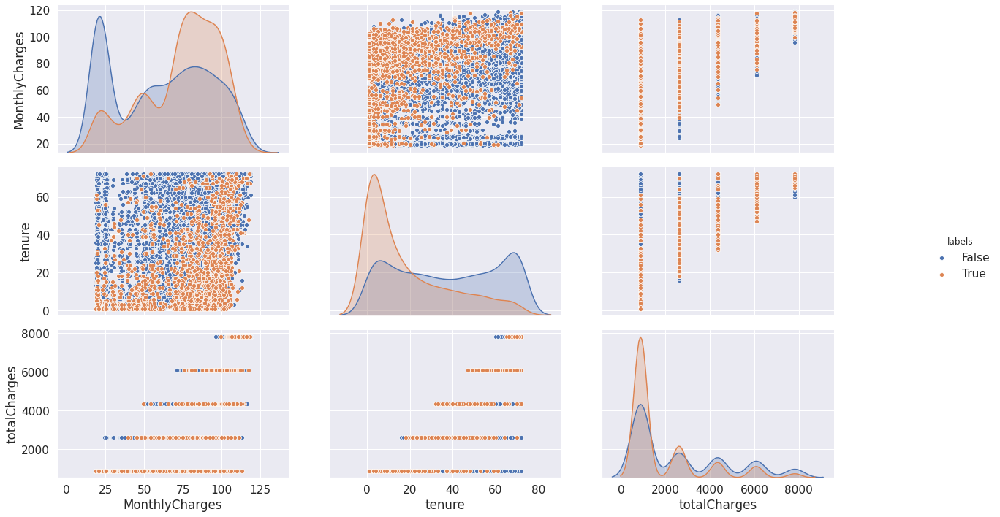

In [8]:
# Seaborn visualizations 
fig = plt.figure(figsize=(20,10))

# Create the df for  pairplot
sns_df = current_data[["MonthlyCharges", "tenure" ]]
sns_df["labels"] = (labels.values )


# Bin the totalCharges column into 5 bins. Replace by mean of bin interval
n_bins = 5
sns.set(font_scale = 1.4)
total_charges = current_data["TotalCharges"].astype(float)
lower, higher = int(total_charges.min()), int(total_charges.max())
edges = range(lower, higher, int((higher - lower)/n_bins))  
lbs = [ (edges[i] + edges[i+1])/2 for i in range(len(edges)-1)]  
sns_df["totalCharges"] = pd.cut(total_charges, bins=n_bins, labels=lbs, include_lowest=True)

# Plot data using pai
ax = sns.pairplot(sns_df,  diag_kind = 'kde', hue="labels" ) 
ax.fig.set_size_inches(20,10)

Explained variation per principal component:  0.9999818703929234 (7032, 2)
 > PCA Complete =========== (7032, 19)
Explained variation per principal component:  0.3443563990893493 (7032, 2)
 > PCA Complete =========== (7032, 19)


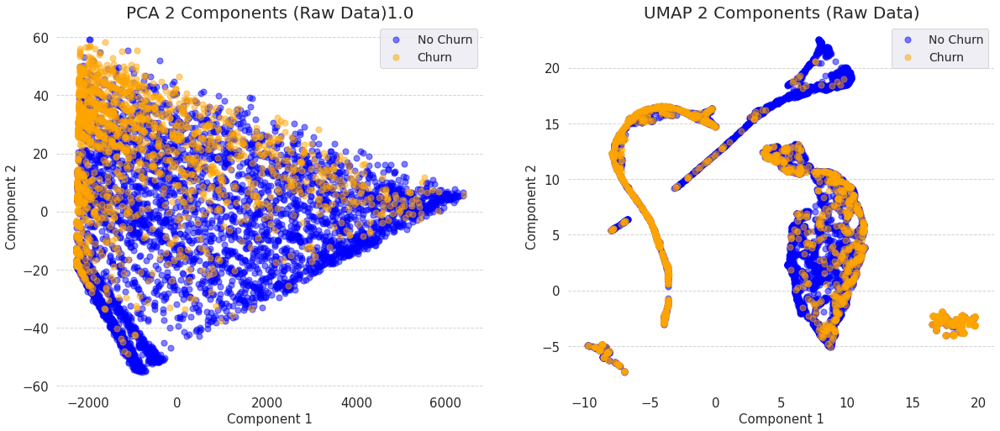

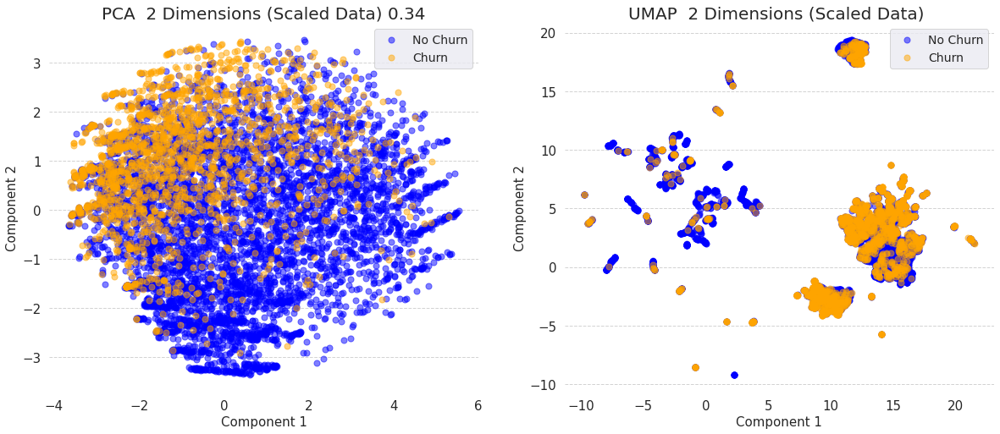

In [9]:
# reduce dimensions with umap
def reduce_dimensions_umap(df):
  reducer = umap.UMAP(metric="cosine")
  embedding = reducer.fit_transform(df)
  return embedding
 
# reduce dimensions with pca
def reduce_dimensions_pca(df, num_features):
    num_features = min(num_features, df.shape[1])
    pca = PCA(n_components=num_features)
    pca = pca.fit(df.values)
    pca_result = pca.transform(df.values)
    print("Explained variation per principal component: ",
          np.sum(pca.explained_variance_ratio_), pca_result.shape)
    print(" > PCA Complete ===========", df.shape)
    return pca, pca_result

def visualize_dims(fig, fig_index, pca_vals, labels, title):
  col_names = [ "pc" +str(e) for e in range(1, pca_vals.shape[1] +1 )] 
  pdpca = pd.DataFrame(pca_vals, columns=col_names)
  pdpca["label"]  = labels

  # Plot PCA values 
  ax = fig.add_subplot(1,2, fig_index) 
  ax.set_xlabel('Component 1', fontsize = 15)
  ax.set_ylabel('Component 2', fontsize = 15)
  ax.set_title(title, fontsize = 20)
  targets = list(labels.unique())
  colors = ['blue', 'orange']
  for target, color in zip(targets,colors):
      indicesToKeep = pdpca['label'] == target 
      ax.scatter(pdpca.loc[indicesToKeep, 'pc1']
                , pdpca.loc[indicesToKeep, 'pc2']
                , c = color
                 , alpha = 0.5
                , s = 50)
  ax.legend(["No Churn", "Churn"])  

scaler = StandardScaler()
scaled_current_data = pd.DataFrame(scaler.fit_transform(current_data))

# compute pca and umap projections
def plot_dim_reduction(data, scale_status):
  num_components = 2 
  
  # visualize projections
  setup_plot()
  fig = plt.figure(figsize = (20,8))
  pca, pca_vals = reduce_dimensions_pca(data, num_components)
  visualize_dims(fig, 1,pca_vals, labels, "PCA " + scale_status +  str(round(np.sum(pca.explained_variance_ratio_),2)) ) 
  plt.box(False)

  umap_vals = reduce_dimensions_umap(data)
  visualize_dims(fig, 2, umap_vals, labels, "UMAP " + scale_status)
  plt.box(False) 

# Note the PCA visualization only is useful for
# inferring properties in the data if 2 component pca 
# explains a large amount of variance.
plot_dim_reduction(current_data, "2 Components (Raw Data)"  )
plot_dim_reduction(scaled_current_data,  " 2 Dimensions (Scaled Data) " )


## Model Training

We can train a set of models on the churn dataset and compare their performance. To simplify this process, we will use the sklearn library and utilize the `model.fit()` api to train the model while recording train and test accuracy. The following models are trained:

- Naive Bayes
- Logistic Regression
- Decision Tree
- Random Forest
- Gradient Boosted Tree 
- Multilayer Perceptron

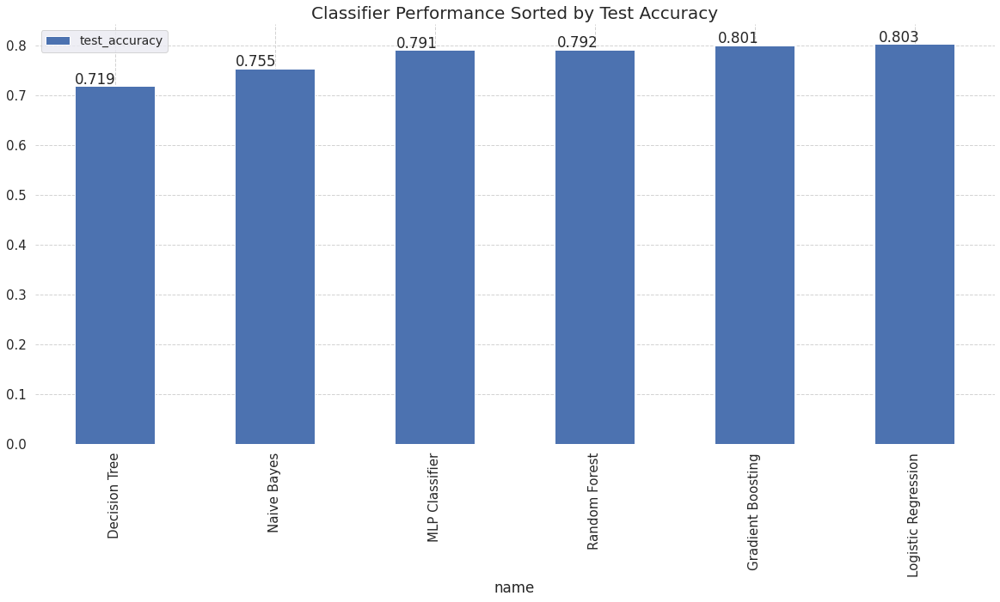

In [28]:
# train the models 
trained_models = [] 

# keep track of all details for models we train
def train_model(model, data, labels): 
  X = data
  y = labels.values
  X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

  pipe = Pipeline([('scaler', StandardScaler()),('clf', model["clf"])])
  start_time = time.time()
  pipe.fit(X_train, y_train)
  train_time = time.time() - start_time

  train_accuracy =  pipe.score(X_train, y_train)
  test_accuracy = pipe.score(X_test, y_test) 
  model_details = {"name": model["name"], "train_accuracy":train_accuracy, "test_accuracy":test_accuracy, "train_time": train_time, "model": pipe}
  return model_details

models = [
          {"name": "Naive Bayes", "clf": GaussianNB()},
          {"name": "Logistic Regression", "clf": LogisticRegressionCV()}, 
          {"name": "Decision Tree", "clf": DecisionTreeClassifier()},
          {"name": "Random Forest", "clf": RandomForestClassifier(n_estimators=100)},
          {"name": "Gradient Boosting", "clf": GradientBoostingClassifier(n_estimators=100)}, 
          {"name": "MLP Classifier", "clf": MLPClassifier(solver='adam', alpha=1e-1, hidden_layer_sizes=(10,10,5,2), max_iter=500, random_state=42)}]

for model in models:
  model_details = train_model(model, current_data, labels) 
  trained_models.append(model_details)


# visualize accuracy and run time
setup_plot()
model_df = pd.DataFrame(trained_models)
model_df.sort_values("test_accuracy", inplace=True) 
ax = model_df[["test_accuracy", "name"]].plot(kind="bar", x="name", figsize=(20,9), title="Classifier Performance Sorted by Test Accuracy")
# ax.legend(["Train Accuracy", "Test Accuracy"])
for p in ax.patches:
    ax.annotate( str( round(p.get_height(),3) ), (p.get_x() * 1.005, p.get_height() * 1.005))

ax.title.set_size(20)
plt.box(False)



The above figures shows:

* Performance performance of 6 classifiers. While the (untuned) Decision Tree     and Random Forest models have high train accuracy, they don’t perform so        well on the test set, indicating **overfitting** for this problem. Gradient     Boosted Tree and Logistic Regression have a good balance of train/test          accuracy for this dataset. 

## Explaining Models

At this point, the train models can be assesed to obtain predictions. Given the data for each telco customer, the probability that churn will occur can be determined. However, what is not very clear is how each of these features contribute to the predicted churn probability.  These explanations are expressed in **global** terms (i.e., How does each feature impact outcomes on the average for the entire datasheet?) or in **local** terms (i.e., How does each feature impact predictions for a specific customer?).
Some models have inbuilt properties that provide these sorts of explanations. These are typically referred to as **white box** models and examples include linear regression (model coefficients), logistic regression (model coefficients) and decision trees (feature importance). Due to their complexity, other models - such as Random Forests, Gradient Boosted Trees, SVMs, Neural Networks etc. - do not have straightforward methods for explaining their predictions. For these models, (also known as **black box** models), LIME and SHAP can be applied to offer a better explanation of features that contribute to individual customer churn.





### Global Explanation - Logistic Regression Coefficients
For models such as linear and logistic regression, model coefficients are used to infer feature importance (note that coefficients need to be  [interpreted](https://web.ma.utexas.edu/users/mks/statmistakes/regressioncoeffs.html) with [care](https://stats.idre.ucla.edu/other/mult-pkg/faq/general/faq-how-do-i-interpret-odds-ratios-in-logistic-regression/) for each model type).  A careful analysis of the model coefficients can show how an increase/change in each feature might result in a change in the log odds that the customer will churn. This type of analysis offers a general understanding of how important a feature is for the entire dataset.

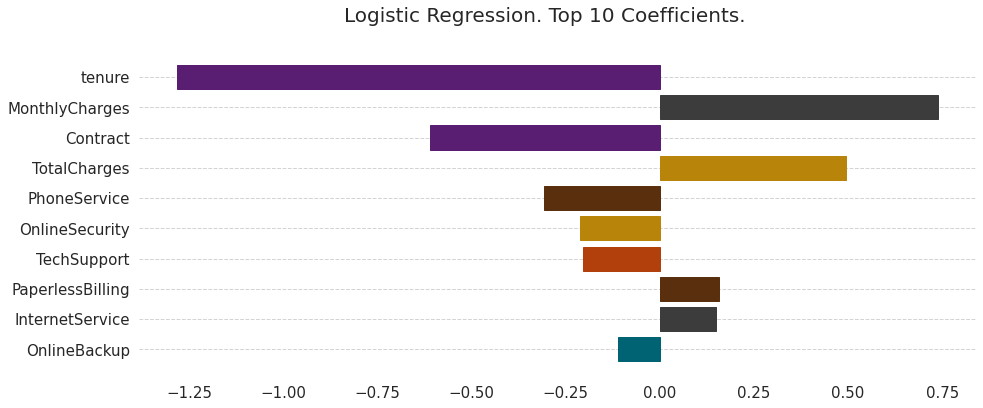

In [11]:
plt.figure(figsize=(15,6))
X_train, X_test, y_train, y_test = train_test_split(current_data, labels.values, random_state=42)
logistic_reg_coeff = trained_models[1]["model"]["clf"].coef_
color_list =  sns.color_palette("dark", len(current_data.columns)) 
top_x = 10
logistic_reg_coeff = trained_models[1]["model"]["clf"].coef_[0]
idx = np.argsort(np.abs(logistic_reg_coeff))[::-1] 
lreg_ax = plt.barh(current_data.columns[idx[:top_x]][::-1], logistic_reg_coeff[idx[:top_x]][::-1])
for i,bar in enumerate(lreg_ax):
  bar.set_color(color_list[idx[:top_x][::-1][i]])
  plt.box(False) 
lr_title = plt.suptitle("Logistic Regression. Top " + str(top_x) + " Coefficients.", fontsize=20, fontweight="normal")


# Explanations via Feature Importance Scores [Tree Based Models]

Tree-based models have properties that let us infer the importance of a feature. For each decision tree, we can compute the mean decrease in impurity for each feature - i.e., how impactful the feature is in reducing the uncertainty (classifiers) or variance (regressors) of the decision tree prediction. This value is also known as the gini importance score. For each tree based model in our list of trained models, we can leverage the sklearn `feature_importance` implementation and visualize the average importance of each variable.


Text(0.5, 0.98, 'Feature Importance for Tree Models. Top 10 Features.')

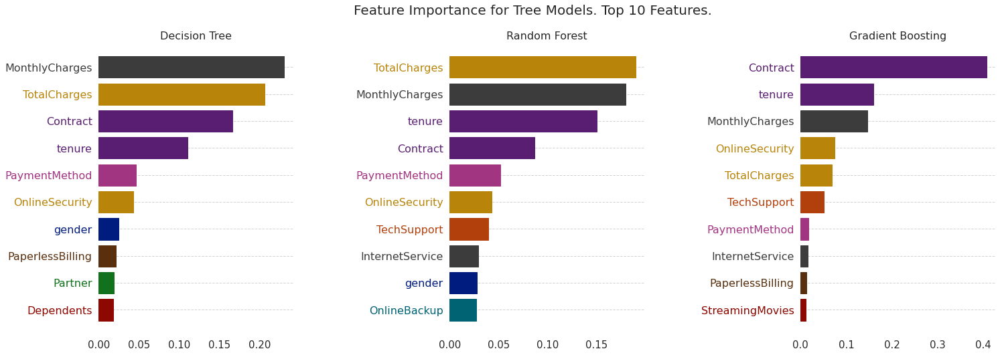

In [12]:
# Create array of tree based models and plot feature importance scores
tree_models = []
setup_plot()
color_list =  sns.color_palette("dark", len(current_data.columns)) 
top_x = 10 # number of x most important features to show
for model in trained_models:
  if hasattr(model["model"]["clf"], 'feature_importances_'): 
    tree_models.append({"name":model["name"], "fi": model["model"]["clf"].feature_importances_}) 
  

fig, axs = plt.subplots(1,3, figsize=(24, 8), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace = 0.5, wspace=0.8)
axs = axs.ravel()
for i in range(len(tree_models)):
  feature_importance = tree_models[i]["fi"]
  indices = np.argsort(feature_importance)
  indices = indices[-top_x:]

  bars = axs[i].barh(range(len(indices)), feature_importance[indices], color='b', align='center') 
  axs[i].set_title( tree_models[i]["name"], fontweight="normal", fontsize=16)

  plt.sca(axs[i])
  plt.yticks(range(len(indices)), [current_data.columns[j] for j in indices], fontweight="normal", fontsize=16) 

  # print(len(plt.gca().get_yticklabels()), len(indices))
  for i, ticklabel in enumerate(plt.gca().get_yticklabels()):
    ticklabel.set_color(color_list[indices[i]])  

  for i,bar in enumerate(bars):
    bar.set_color(color_list[indices[i]])
  plt.box(False)
  
plt.suptitle("Feature Importance for Tree Models. Top " + str(top_x) + " Features.", fontsize=20, fontweight="normal")
 

These feature importance values look interesting. All 3 models appear to consistently rank `Monthly Charges`, `Total Charges`, `Contract` and `Tenure` in the top 5 most important features. It is notable that each model ranks each feature differently. 

There are several limitations: 
- The feature importance scores are relative, making it hard to interpret with respect to the predicted outcome. While the `Total Charges` is relatively more important than `Contract` feature in the Decision Tree model, there is no indication how much an increase in `Total Charges` impacts the probability of a customer churning.
- Feature importance measures are global estimates across the ***entire training dataset.*** For a subset of customers, within each model, the order and magnitude of feature importance may change (see the section below on local instance explanations). Therefore, while the feature, `Total Charges` is important in Tree models, the question: "How does Total Charges affect a specific customer?" can not be answered with a high degree of confidence.

- There are known biases related to how the feature importance score is computed in Tree models. When a different types of features (object, numeric) are combined in a dataset, the degree of confidence that the model will select the best features is diminished considerably.

    See ([Bias in random forest variable importance measures: Illustrations,    sources and a solution](https://link.springer.com/article/10.1186%2F1471-2105-8-25))


These limitations make it desirable to explore local explanations.


## Explanations with LIME

Local Interpretable Model-agnostic Explanation ([LIME](https://arxiv.org/abs/1602.04938)) provides a fast and relatively simple method for `locally` explaining black box models. The LIME algorithm can be simplified into a few steps

- For a given data point, random noise (mathematical term: perturb) is added to assess its collinearity. For tabular data, this entails adding a small amount of noise to each feature.  
- Get predictions for each perturbed data instance. This helps us build up a local picture of the decision surface at that point.
- Use predictions to compute an approximate linear "explanation model" using predictions. Coefficients of the linear model are used as explanations.


The LIME python library provides interfaces for explaining models built on tabular (TabularExplainer), images (LimeImageExplainer), and text data (LimeTextExplainer). 

In the following section, the LimeTabularExplainer predictions are explained for the Telco Churn test data instance for all trained models.


## LIME Tabular Explainer: Explain a test data instance for all models

In the following section, lime explanations for a given data point in the test set will be visualised and explained for each trained model. 

In [13]:
from lime.lime_tabular import LimeTabularExplainer
X_train, X_test, y_train, y_test = train_test_split(current_data, labels, random_state=42) 

def get_lime_explainer(model, data, labels):  

  cat_feat_ix = [i for i,c in enumerate(data.columns) if pd.api.types.is_categorical_dtype(data[c])]
  feat_names = list(data.columns)
  class_names = list(labels.unique())
  scaler = model["model"]["scaler"]
  data = scaler.transform(data) # scale data to reflect train time scaling
  lime_explainer = LimeTabularExplainer(data,
                                      feature_names=feat_names,
                                      class_names=class_names,
                                      categorical_features=cat_feat_ix ,
                                      mode="classification"
                                      )
  return lime_explainer

def lime_explain(explainer, data, predict_method, num_features): 
  explanation = explainer.explain_instance(data, predict_method, num_features=num_features) 
  return explanation

lime_data_explainations = []
lime_metrics = []
lime_explanation_time = []
feat_names = list(current_data.columns)
test_data_index = 6
for current_model in trained_models:  
  scaler = current_model["model"]["scaler"]
  scaled_test_data = scaler.transform(X_test)
  predict_method = current_model["model"]["clf"].predict_proba 

  start_time = time.time()
  # explain first sample from test data
  lime_explainer = get_lime_explainer(current_model, X_train, y_train)
  explanation = lime_explain(lime_explainer, scaled_test_data[test_data_index], predict_method, top_x) 
  elapsed_time = time.time() - start_time 

  ex_holder = {}
  for feat_index,ex in explanation.as_map()[1] :
    ex_holder[feat_names[feat_index]] = ex
  
  lime_data_explainations.append(ex_holder) 
  actual_pred = predict_method(scaled_test_data[test_data_index].reshape(1,-1))
  perc_pred_diff =  abs(actual_pred[0][1] - explanation.local_pred[0])   
  lime_explanation_time.append({"time": elapsed_time, "model": current_model["name"] })
  lime_metrics.append({"lime class1": explanation.local_pred[0], "actual class1": actual_pred[0][1], "class_diff": round(perc_pred_diff,3), "model": current_model["name"] })
  # break 

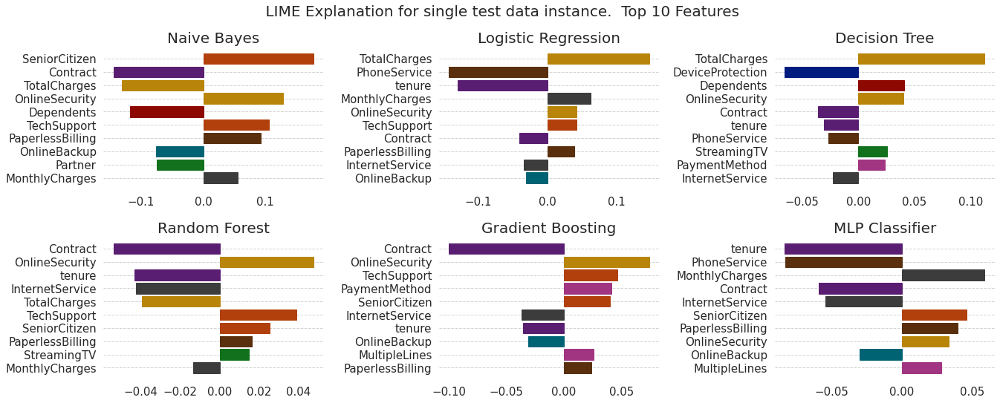

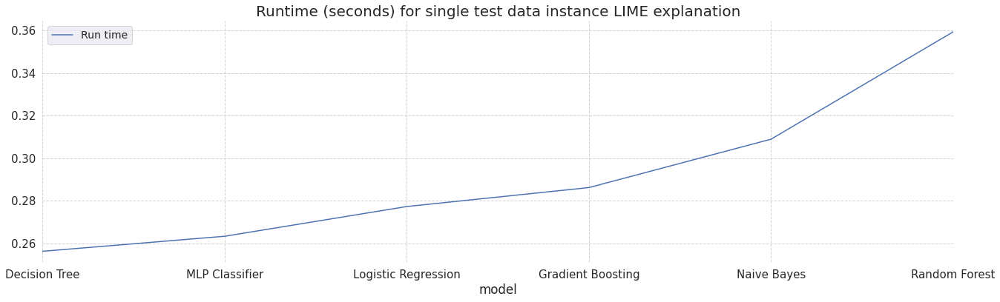

In [14]:
def plot_lime_exp(fig, fig_index, exp_data, title):
  features =  list(exp_data.keys())[::-1]
  explanations = list(exp_data.values())[::-1]
  ax = fig.add_subplot(fig_index) 
  lime_bar = ax.barh( features, explanations ) 
  ax.set_title(title, fontsize = 20)
  for i,bar in enumerate(lime_bar):
    bar.set_color(color_list[list(current_data.columns).index(features[i])])
    plt.box(False) 
fig = plt.figure(figsize=(19,8))

# Plot lime explanations for trained models
for i, dex in enumerate(lime_data_explainations):
  fig_index = "23" + str(i+1)
  plot_lime_exp(fig, fig_index, lime_data_explainations[i], trained_models[i]["name"])

plt.suptitle( " LIME Explanation for single test data instance.  Top " + str(top_x) + " Features", fontsize=20, fontweight="normal")
fig.tight_layout(rect=[0, 0.03, 1, 0.95])

# Plot run time for explanations
lx_df = pd.DataFrame(lime_explanation_time)
lx_df.sort_values("time", inplace=True)
setup_plot()
lx_ax = lx_df.plot(kind="line", x="model", title="Runtime (seconds) for single test data instance LIME explanation", figsize=(22,6))
lx_ax.title.set_size(20)
lx_ax.legend(["Run time"])
plt.box(False)

## Debugging  LIME: Should I trust the Explanation?


Underneath, the LIME algorithm uses an approximate linear model to derive local explanations. Like any other ML model, this explanation model can have *issues* too. So, what can we do to build   confidence in the quality of an explanation. As a first step, we can check if the local model is indeed a good approximator for the original model.    

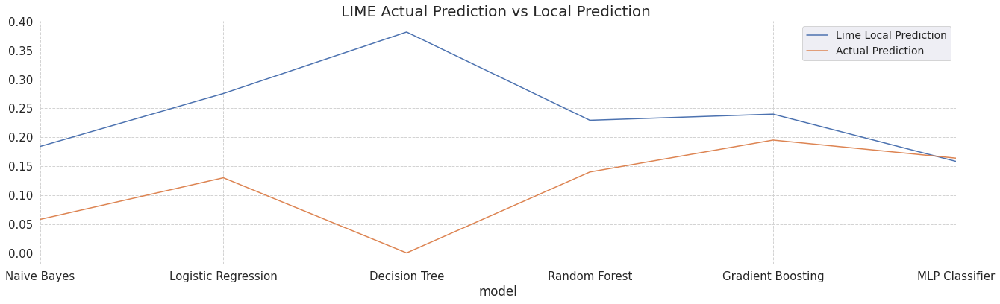

In [15]:
# Plot run time for explanations
lime_metrics_df = pd.DataFrame(lime_metrics)  
lime_metrics_df_ax = lime_metrics_df[["lime class1", "actual class1", "model"]].plot(kind="line", x="model", title="LIME Actual Prediction vs Local Prediction ", figsize=(22,6))
lime_metrics_df_ax.title.set_size(20)
lime_metrics_df_ax.legend(["Lime Local Prediction", "Actual Prediction"])
plt.box(False)

The plot above shows the predictions made by the LIME local model and the original model for the explained data instance. Both numbers should be close.  When they are not, this may raise questions as to if we can trust the explanation. There are few things that can be done:
-  Modify the parameters of LIME to yield a better explanation. E.g. increase the number of perturbations (LIME) or kernel width (see related discussion  [here](https://github.com/marcotcr/lime/issues/209)), 
- Improve our original model (In this case, we know that the Decision Tree shows signs of overfitting). 

## LIME: What are the limitations?

- LIME is not designed to work with one hot encoded data. Considering that each data point is perturbed to create the approximate model, perturbing a one hot encoded variable may result in unexpected (meaningless) features. See discussion [here](https://github.com/marcotcr/lime/issues/153)
- LIME depends on the ability to perturb samples in meaningful ways. This perturbation is use case specific. E.g., for tabular data, this entails adding random noise to each feature; for images, this entails replacing superpixels within the image with some mean value or zeroes; for text, this entails removing words from the text. It is often useful to think through any side effects of these perturbation strategies with respect to your data to further build trust in the explanation.
- In some cases, the local model built by LIME may fail to approximate the behaviour of the original model. It is good practice to check for such inconsistencies before trusting LIME explanations. 

- LIME works with models that output probabilities for classification problems. Models like SVMs are not particularly designed to output probabilities (though they can be coerced into this with some [issues](https://scikit-learn.org/stable/modules/svm.html).). This may introduce some bias into the explanations.

## Further Reading 

For additional reading on other interpretability methods, the [Interpretable ML book by  Christoph Molnar  is recommended](https://christophm.github.io/interpretable-ml-book/).

- Interpretability - Cloudera Fast Forward Labs https://ff06-2020.fastforwardlabs.com/
- SHAP vs Integrated Gradients https://blog.fiddler.ai/2019/08/should-you-explain-your-predictions-with-shap-or-ig/
- Interpretable Machine Learning https://christophm.github.io/interpretable-ml-book/
